In [1]:
!pip install pillow

In [2]:
!pip install requests

# Importing Libraries

In [3]:
from io import BytesIO
import IPython
import json
import os
from PIL import Image
import requests
import time
from google.colab import output

# Connect to Stability API

In [4]:


import getpass
# To get your API key visit https://platform.stability.ai/account/keys
STABILITY_KEY = getpass.getpass('Enter your API Key')



Enter your API Key··········


# Function for image generation

In [5]:
#@title Define functions

def send_generation_request(
    host,
    params,
):
    headers = {
        "Accept": "image/*",
        "Authorization": f"Bearer {STABILITY_KEY}"
    }

    # Encode parameters
    files = {}
    image = params.pop("image", None)
    mask = params.pop("mask", None)
    if image is not None and image != '':
        files["image"] = open(image, 'rb')
    if mask is not None and mask != '':
        files["mask"] = open(mask, 'rb')
    if len(files)==0:
        files["none"] = ''

    # Send request
    print(f"Sending REST request to {host}...")
    response = requests.post(
        host,
        headers=headers,
        files=files,
        data=params
    )
    if not response.ok:
        raise Exception(f"HTTP {response.status_code}: {response.text}")

    return response

def send_async_generation_request(
    host,
    params,
):
    headers = {
        "Accept": "application/json",
        "Authorization": f"Bearer {STABILITY_KEY}"
    }

    # Encode parameters
    files = {}
    if "image" in params:
        image = params.pop("image")
        files = {"image": open(image, 'rb')}

    # Send request
    print(f"Sending REST request to {host}...")
    response = requests.post(
        host,
        headers=headers,
        files=files,
        data=params
    )
    if not response.ok:
        raise Exception(f"HTTP {response.status_code}: {response.text}")

    # Process async response
    response_dict = json.loads(response.text)
    generation_id = response_dict.get("id", None)
    assert generation_id is not None, "Expected id in response"

    # Loop until result or timeout
    timeout = int(os.getenv("WORKER_TIMEOUT", 500))
    start = time.time()
    status_code = 202
    while status_code == 202:
        response = requests.get(
            f"{host}/result/{generation_id}",
            headers={
                **headers,
                "Accept": "image/*"
            },
        )

        if not response.ok:
            raise Exception(f"HTTP {response.status_code}: {response.text}")
        status_code = response.status_code
        time.sleep(10)
        if time.time() - start > timeout:
            raise Exception(f"Timeout after {timeout} seconds")

    return response

# Stable Image Ultra

Sending REST request to https://api.stability.ai/v2beta/stable-image/generate/ultra...
Saved image generated_1250005072.png


<IPython.core.display.Javascript object>

Result image:


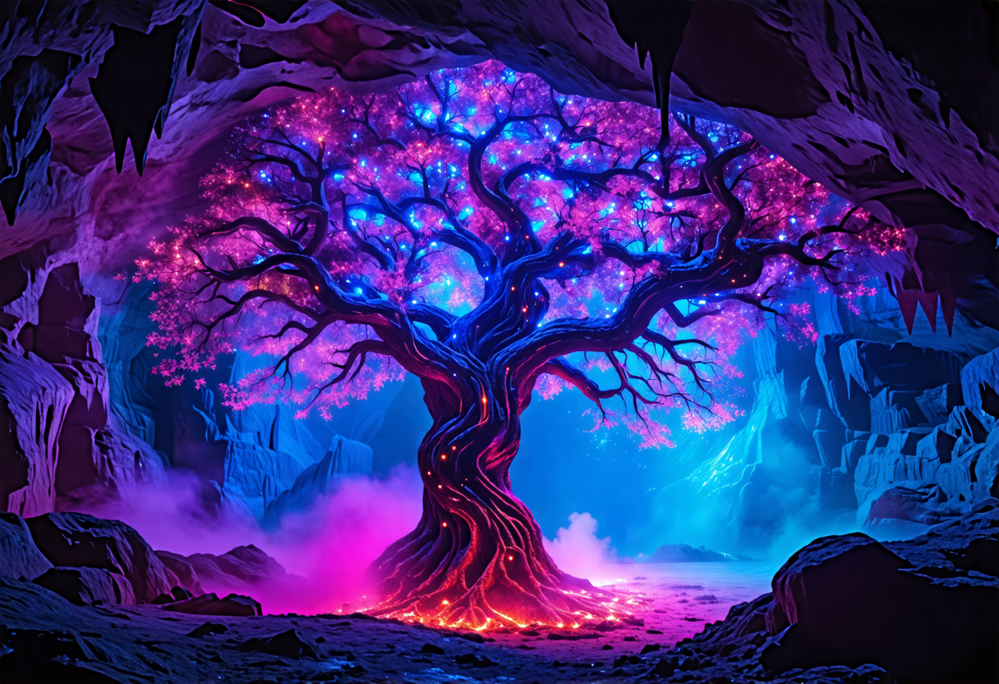

In [6]:
#@title Stable Image Ultra

prompt = "dark high contrast render of a psychedelic tree of life illuminating dust in a mystical cave." #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
aspect_ratio = "3:2" #@param ["21:9", "16:9", "3:2", "5:4", "1:1", "4:5", "2:3", "9:16", "9:21"]
seed = 0 #@param {type:"integer"}
output_format = "png" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/generate/ultra"

params = {
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
    "aspect_ratio" : aspect_ratio,
    "seed" : seed,
    "output_format": output_format
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
generated = f"generated_{seed}.{output_format}"
with open(generated, "wb") as f:
    f.write(output_image)
print(f"Saved image {generated}")

output.no_vertical_scroll()
print("Result image:")
IPython.display.display(Image.open(generated))


# Stable Image Core

Sending REST request to https://api.stability.ai/v2beta/stable-image/generate/core...
Saved image generated_2316505853.png


<IPython.core.display.Javascript object>

Result image:


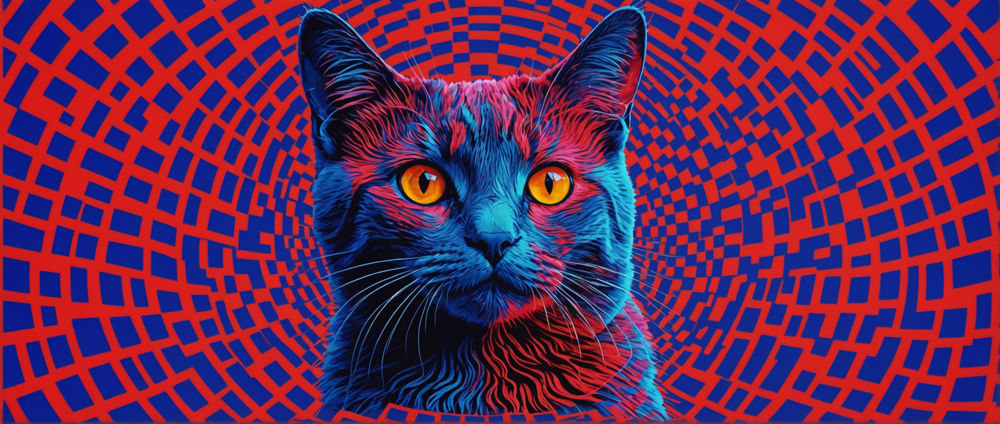

In [7]:
#@title Stable Image Core

prompt = "op art cat illusion red blue chromostereopsis maximum saturation" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
aspect_ratio = "21:9" #@param ["21:9", "16:9", "3:2", "5:4", "1:1", "4:5", "2:3", "9:16", "9:21"]
seed = 0 #@param {type:"integer"}
output_format = "png" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/generate/core"

params = {
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
    "aspect_ratio" : aspect_ratio,
    "seed" : seed,
    "output_format": output_format
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
generated = f"generated_{seed}.{output_format}"
with open(generated, "wb") as f:
    f.write(output_image)
print(f"Saved image {generated}")

output.no_vertical_scroll()
print("Result image:")
IPython.display.display(Image.open(generated))


# Stable SD3

Sending REST request to https://api.stability.ai/v2beta/stable-image/generate/sd3...
Saved image generated_2138806922.jpeg


<IPython.core.display.Javascript object>

Result image:


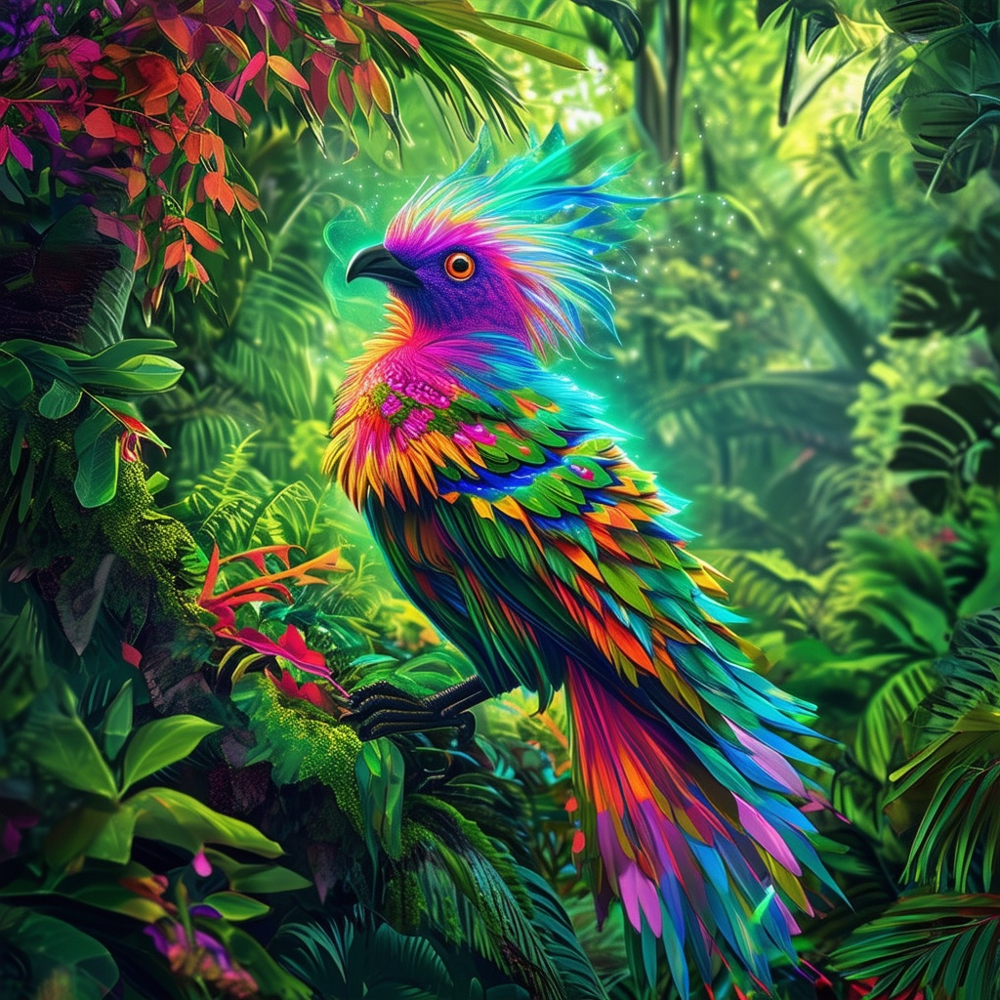

In [8]:
#@title SD3

prompt = "This dreamlike digital art captures a vibrant, kaleidoscopic bird in a lush rainforest" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
aspect_ratio = "1:1" #@param ["21:9", "16:9", "3:2", "5:4", "1:1", "4:5", "2:3", "9:16", "9:21"]
seed = 0 #@param {type:"integer"}
output_format = "jpeg" #@param ["jpeg", "png"]
model = "sd3-large" #@param ["sd3-large", "sd3-large-turbo", "sd3-medium"]

host = f"https://api.stability.ai/v2beta/stable-image/generate/sd3"

params = {
    "prompt" : prompt,
    "negative_prompt" : negative_prompt if model=="sd3" else "",
    "aspect_ratio" : aspect_ratio,
    "seed" : seed,
    "output_format" : output_format,
    "model" : model,
    "mode" : "text-to-image"
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
generated = f"generated_{seed}.{output_format}"
with open(generated, "wb") as f:
    f.write(output_image)
print(f"Saved image {generated}")

output.no_vertical_scroll()
print("Result image:")
IPython.display.display(Image.open(generated))

# Stability Sketch

Sending REST request to https://api.stability.ai/v2beta/stable-image/control/sketch...
Saved image edited_Skatch_3459428303.webp


<IPython.core.display.Javascript object>

Original image:


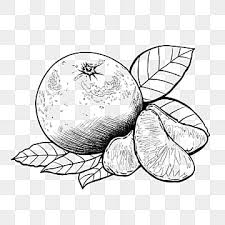

Result image:


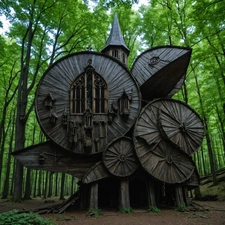

In [9]:
#@title Sketch

#@markdown - Drag and drop image to file folder on left
#@markdown - Right click it and choose Copy path
#@markdown - Paste that path into image field below
#@markdown <br><br>

image = "/content/Skatch.jfif" #@param {type:"string"}
prompt = "a creepy wooden cathedral in the forest" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
control_strength = 0.7  #@param {type:"slider", min:0, max:1, step:0.05}
seed = 0 #@param {type:"integer"}
output_format = "webp" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/control/sketch"

params = {
    "control_strength" : control_strength,
    "image" : image,
    "seed" : seed,
    "output_format": output_format,
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
filename, _ = os.path.splitext(os.path.basename(image))
edited = f"edited_{filename}_{seed}.{output_format}"
with open(edited, "wb") as f:
    f.write(output_image)
print(f"Saved image {edited}")

output.no_vertical_scroll()
print("Original image:")
IPython.display.display(Image.open(image))
print("Result image:")
IPython.display.display(Image.open(edited))

# Stability control

Sending REST request to https://api.stability.ai/v2beta/stable-image/control/structure...
Saved image edited_structure_3354821490.webp


<IPython.core.display.Javascript object>

Original image:


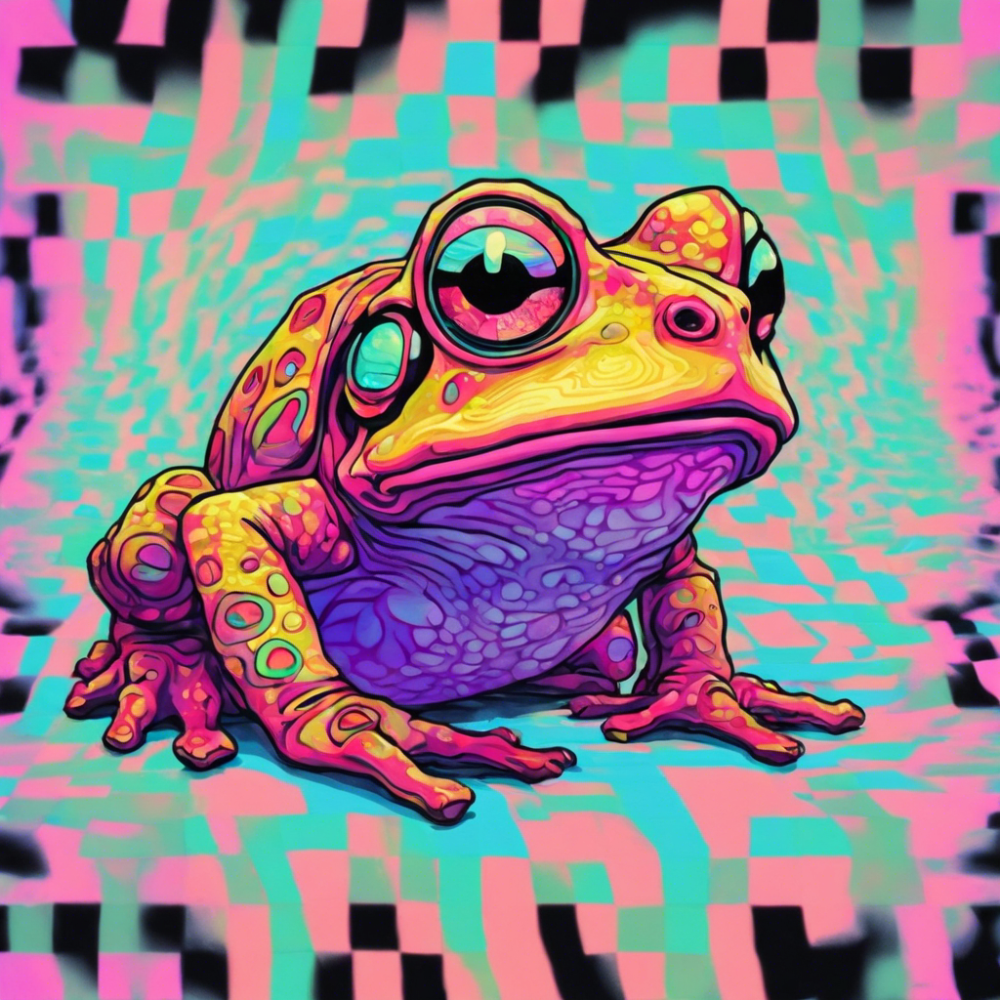

Result image:


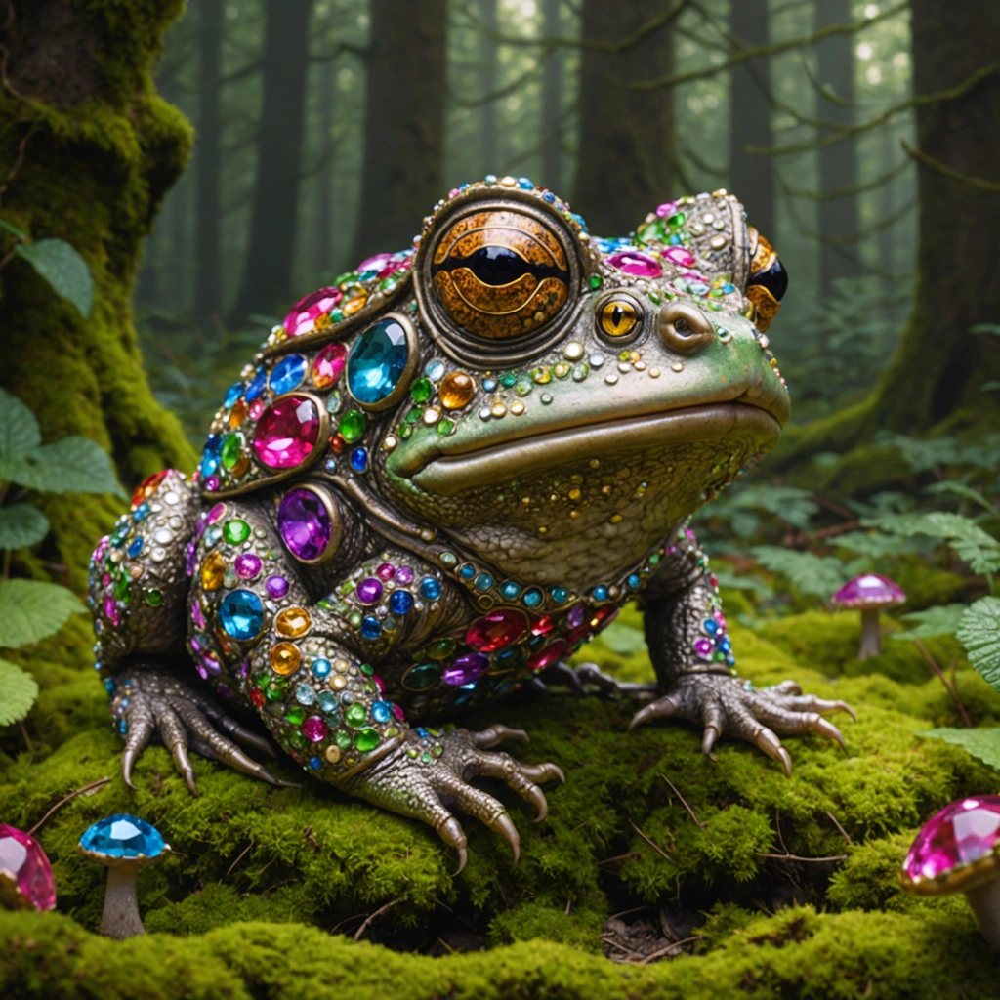

In [10]:
#@title Structure

#@markdown - Drag and drop image to file folder on left
#@markdown - Right click it and choose Copy path
#@markdown - Paste that path into image field below
#@markdown <br><br>

image = "/content/structure.png" #@param {type:"string"}
prompt = "a victorian toad covered in gems standing in the forest, looking at the viewer" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
control_strength = 0.7  #@param {type:"slider", min:0, max:1, step:0.05}
seed = 0 #@param {type:"integer"}
output_format = "webp" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/control/structure"

params = {
    "control_strength" : control_strength,
    "image" : image,
    "seed" : seed,
    "output_format": output_format,
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
filename, _ = os.path.splitext(os.path.basename(image))
edited = f"edited_{filename}_{seed}.{output_format}"
with open(edited, "wb") as f:
    f.write(output_image)
print(f"Saved image {edited}")

output.no_vertical_scroll()
print("Original image:")
IPython.display.display(Image.open(image))
print("Result image:")
IPython.display.display(Image.open(edited))

# Stability Style

Sending REST request to https://api.stability.ai/v2beta/stable-image/control/style...
Saved image edited_forest_2017601091.webp


<IPython.core.display.Javascript object>

Original image:


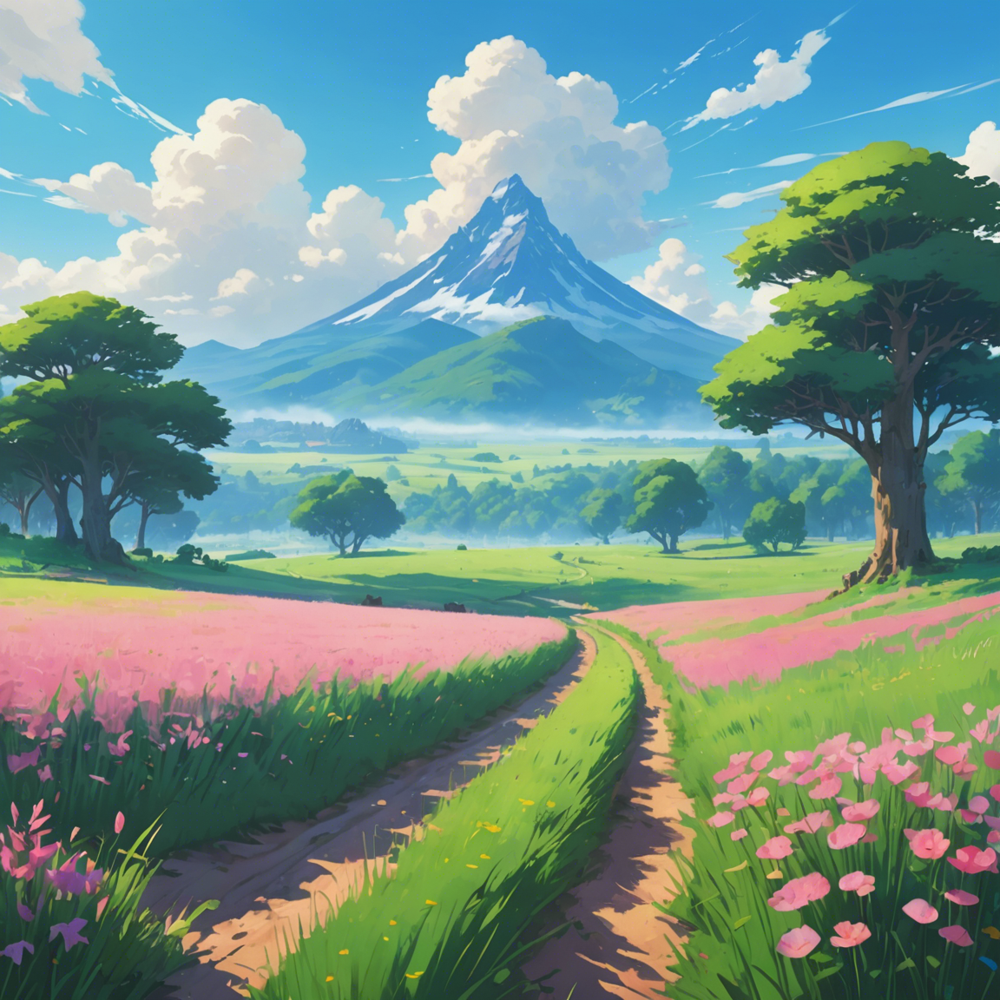

Result image:


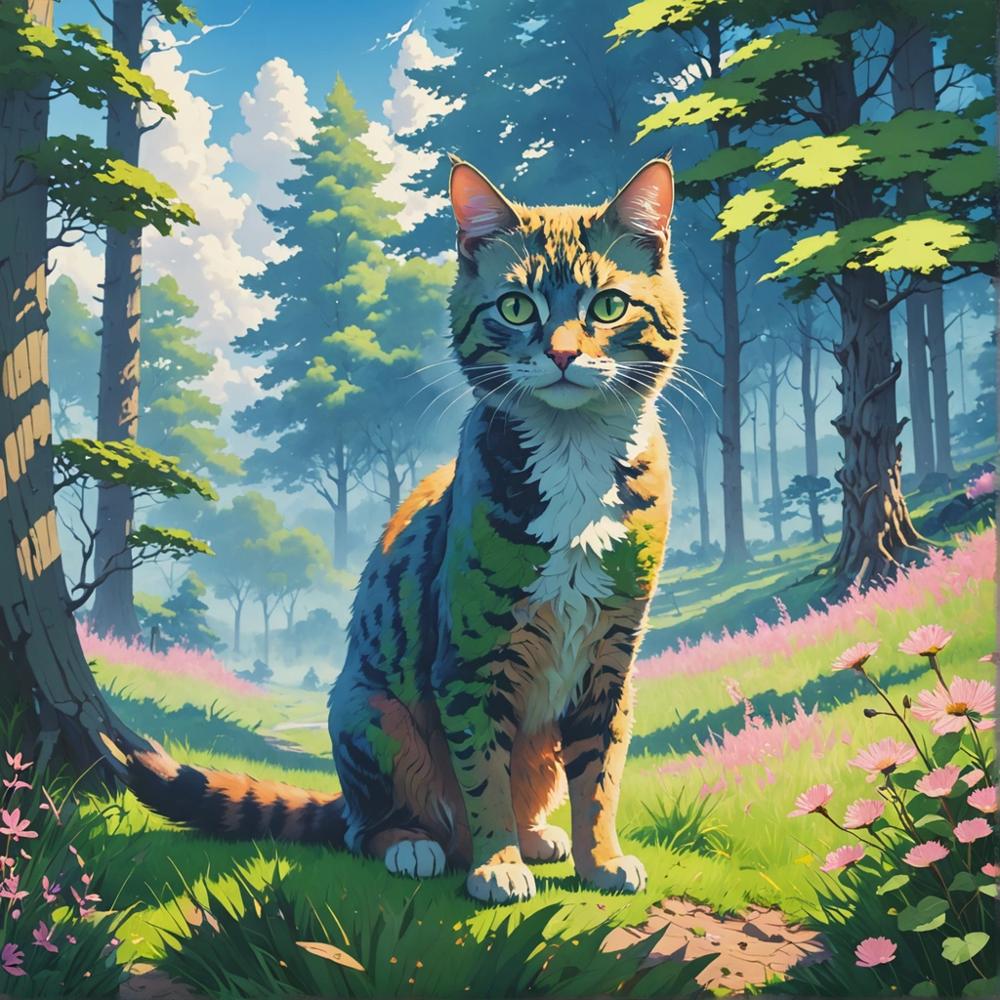

In [11]:
#@title Style

#@markdown - Drag and drop image to file folder on left
#@markdown - Right click it and choose Copy path
#@markdown - Paste that path into image field below
#@markdown <br><br>

image = "/content/forest.png" #@param {type:"string"}
prompt = "cat in the forest" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
aspect_ratio = "1:1" #@param ["21:9", "16:9", "3:2", "5:4", "1:1", "4:5", "2:3", "9:16", "9:21"]
fidelity = 0.5  #@param {type:"slider", min:0, max:1, step:0.05}
seed = 0 #@param {type:"integer"}
output_format = "webp" #@param ["webp", "jpeg", "png"]

host = f"https://api.stability.ai/v2beta/stable-image/control/style"

params = {
    "fidelity" : fidelity,
    "image" : image,
    "seed" : seed,
    "output_format": output_format,
    "prompt" : prompt,
    "negative_prompt" : negative_prompt,
}

response = send_generation_request(
    host,
    params
)

# Decode response
output_image = response.content
finish_reason = response.headers.get("finish-reason")
seed = response.headers.get("seed")

# Check for NSFW classification
if finish_reason == 'CONTENT_FILTERED':
    raise Warning("Generation failed NSFW classifier")

# Save and display result
filename, _ = os.path.splitext(os.path.basename(image))
edited = f"edited_{filename}_{seed}.{output_format}"
with open(edited, "wb") as f:
    f.write(output_image)
print(f"Saved image {edited}")

output.no_vertical_scroll()
print("Original image:")
IPython.display.display(Image.open(image))
print("Result image:")
IPython.display.display(Image.open(edited))